In [1]:
from ohsome import OhsomeClient

import altair as alt
#import altair_tiles as til
import geopandas as gpd
import pandas as pd


In [2]:
#alt.data_transformers.enable("vegafusion")

In [3]:
#This Script gets a geometry from osm via overpass and gets a osm streetnetwork incl history for this geometry.

# get geometry

In [4]:
#gdf_polygons_filtered_germany = gpd.read_file(r"output\gdf_polygons_filtered_germany.gpkg")
gdf_polygons_filtered_germany = gpd.read_file("output/germany_raster2022_net_acc.gpkg")

In [5]:
#gdf_polygons_filtered_germany

In [6]:
# List of columns to round to the nearest integer
columns_to_round = [
    "2017_length_50", "2024_length_50", "2017_length_30", "2024_length_30",
    "2017_total_length", "2024_total_length", 
]

# List of columns to round to two decimal places
columns_to_round_2 = [
    "2017_ratio", "2024_ratio",
    "diff_total_length_rel", "diff_ratio_tempo30"
]

# Round the specified columns to the nearest integer and convert to integer type
gdf_polygons_filtered_germany[columns_to_round] = gdf_polygons_filtered_germany[columns_to_round].round(0).astype(int)

# Round the specified columns to two decimal places
gdf_polygons_filtered_germany[columns_to_round_2] = gdf_polygons_filtered_germany[columns_to_round_2].round(2)


In [7]:
#gdf_polygons_filtered_germany

In [8]:
# Define the new column order
new_column_order = [ "id_left",
    "2017_length_30", "2017_length_50", "2017_total_length", "2017_ratio",
    "2024_length_30", "2024_length_50", "2024_total_length", "2024_ratio",
    "diff_total_length", "diff_total_length_rel", "diff_ratio_tempo30"
]

# Reorder the columns while keeping the rest unchanged
remaining_columns = [col for col in gdf_polygons_filtered_germany.columns if col not in new_column_order]
final_column_order = new_column_order + remaining_columns

# Reorder DataFrame
gdf_polygons_filtered_germany = gdf_polygons_filtered_germany[final_column_order]



In [9]:
#gdf_polygons_filtered_germany

In [10]:
gdf_polygons_filtered_germany[gdf_polygons_filtered_germany["2024_total_length"]>3000].sort_values("diff_ratio_tempo30")

,id_left,2017_length_30,2017_length_50,2017_total_length,2017_ratio,2024_length_30,2024_length_50,2024_total_length,2024_ratio,diff_total_length,...,2018_count,2019_count,2020_count,2021_count,2022_count,2023_count,vorher,nachher,unfall_ratio,geometry
66,1kmN3278E4552,3193,3177,6369,0.50,597,5411,6008,0.10,-361.730322,...,16.0,28.0,15.0,10.0,10.0,12.0,44.0,22.0,-0.500000,"MULTIPOLYGON (((798709.993 5832733.276, 799710..."
135,1kmN3277E4553,2202,4333,6535,0.34,733,6261,6994,0.10,458.723340,...,28.0,34.0,30.0,22.0,25.0,28.0,62.0,53.0,-0.145161,"MULTIPOLYGON (((799724.754 5831747.113, 800725..."
192,1kmN3266E4565,727,2439,3166,0.23,264,3168,3432,0.08,266.759032,...,13.0,14.0,19.0,10.0,9.0,14.0,27.0,23.0,-0.148148,"MULTIPOLYGON (((811888.448 5820912.935, 812889..."
202,1kmN3385E4319,577,2784,3361,0.17,105,3275,3380,0.03,18.722259,...,20.0,8.0,21.0,15.0,29.0,23.0,28.0,52.0,0.857143,"MULTIPOLYGON (((564219.211 5936413.222, 565218..."
203,1kmN3167E4500,1090,2698,3789,0.29,558,3222,3780,0.15,-8.869823,...,5.0,5.0,7.0,3.0,5.0,10.0,10.0,15.0,0.500000,"MULTIPOLYGON (((748218.416 5720974.103, 749218..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6089,1kmN2766E4160,200,4797,4997,0.04,3173,2039,5212,0.61,214.904496,...,38.0,51.0,29.0,30.0,40.0,51.0,89.0,91.0,0.022472,"MULTIPOLYGON (((413740.324 5315440.627, 414739..."
6108,1kmN3274E4551,575,3177,3752,0.15,2721,985,3706,0.73,-46.031855,...,98.0,76.0,70.0,63.0,70.0,69.0,174.0,139.0,-0.201149,"MULTIPOLYGON (((797765.343 5828717.164, 798766..."
6130,1kmN2837E4280,1488,3483,4971,0.30,4936,552,5487,0.90,515.763141,...,12.0,12.0,13.0,7.0,11.0,14.0,24.0,25.0,0.041667,"MULTIPOLYGON (((532691.82 5388086.485, 533690...."
6163,1kmN2989E4196,982,4924,5907,0.17,4936,1212,6148,0.80,241.384940,...,56.0,46.0,22.0,27.0,44.0,39.0,102.0,83.0,-0.186275,"MULTIPOLYGON (((446718.033 5538900.249, 447717..."


In [11]:
#gdf_polygons_filtered_germany.explore(column="diff_ratio_tempo30", tiles="CartoDB positron", cmap="coolwarm_r") # seismic_r

In [12]:
gdf_polygons_filtered_germany[gdf_polygons_filtered_germany["2024_total_length"]>3000].sort_values("diff_ratio_tempo30").explore(column="diff_ratio_tempo30", tiles="CartoDB positron", cmap="coolwarm_r") # seismic_r

In [13]:
#gdf_rasters = gdf_polygons_filtered_germany[
#    gdf_polygons_filtered_germany["2024_total_length"] > 3000
#].to_crs(epsg=3857).copy()

gdf_rasters=gdf_polygons_filtered_germany.to_crs(epsg=3857).copy()

In [14]:


# Step 1: Compute the centroids of the polygons
gdf_centroids = gdf_rasters.copy()
gdf_centroids["geometry"] = gdf_rasters.geometry.centroid

# Step 2: Buffer the centroids by 400 meters
gdf_buffered_centroids = gdf_centroids.copy()
gdf_buffered_centroids["geometry"] = gdf_centroids.geometry.buffer(400)

# Step 3: Clip the original polygons by removing the buffered areas
gdf_cut = gdf_rasters.copy()
gdf_cut["geometry"] = gdf_rasters.geometry.difference(gdf_buffered_centroids.union_all())




In [15]:
import folium

import branca.colormap as cm
import numpy as np

# Ensure both GeoDataFrames are in WGS84 (EPSG:4326) for Folium
gdf_buffered_centroids = gdf_buffered_centroids.to_crs(epsg=4326)
gdf_cut = gdf_cut.to_crs(epsg=4326)

# Fix: Replace NaN values to avoid colormap errors
gdf_buffered_centroids["unfall_ratio"] = gdf_buffered_centroids["unfall_ratio"].fillna(0)
gdf_cut["diff_ratio_tempo30"] = gdf_cut["diff_ratio_tempo30"].fillna(0)

gdf_buffered_centroids=gdf_buffered_centroids[gdf_buffered_centroids["2024_total_length"]>1000].copy()
gdf_buffered_centroids=gdf_buffered_centroids[gdf_buffered_centroids["vorher"]>=3].copy()
gdf_cut=gdf_cut[gdf_cut["2024_total_length"]>1000].copy()
gdf_cut=gdf_cut[gdf_cut["vorher"]>=3].copy()


gdf_cut = gdf_cut.round(2)
gdf_buffered_centroids = gdf_buffered_centroids.round(2)


tooltip_fields = [
    'id_left', '2017_length_30', '2017_length_50', '2017_total_length',
    '2017_ratio', '2024_length_30', '2024_length_50', '2024_total_length',
    '2024_ratio', 'diff_total_length', 'diff_total_length_rel',
    'diff_ratio_tempo30', '2017_count', '2018_count', '2019_count',
    '2020_count', '2021_count', '2022_count', '2023_count', 'vorher',
    'nachher', 'unfall_ratio'
]

# Create alias labels for tooltips (optional, for better readability)
tooltip_aliases = [
    "Kachel-ID", "2017 Length 30", "2017 Length 50", "2017 Total Length",
    "2017 Ratio", "2024 Length 30", "2024 Length 50", "2024 Total Length",
    "2024 Ratio", "Diff Total Length", "Diff Total Length Rel",
    "Diff Ratio Tempo30", "2017 Unfall-Count", "2018 Unfall-Count", "2019 Unfall-Count",
    "2020 Unfall-Count", "2021 Unfall-Count", "2022 Unfall-Count", "2023 Unfall-Count", "Before",
    "After", "Accident Ratio"
]




# Get max absolute values for centered colormaps
max_unfall = max(abs(gdf_buffered_centroids["unfall_ratio"].min()), abs(gdf_buffered_centroids["unfall_ratio"].max()))
max_diff_tempo30 = max(abs(gdf_cut["diff_ratio_tempo30"].min()), abs(gdf_cut["diff_ratio_tempo30"].max()))

# Create a base map with CartoDB Positron tiles
m = folium.Map(
location=[gdf_buffered_centroids.geometry.to_crs(epsg=3857).centroid.to_crs(epsg=4326).y.mean(), 
          gdf_buffered_centroids.geometry.to_crs(epsg=3857).centroid.to_crs(epsg=4326).x.mean()], 
    zoom_start=9, 
    control_scale=True,
    tiles="CartoDB Positron"
)

### 1. Add gdf_buffered_centroids layer with unfall_ratio coloring ###
buffer_colormap = cm.LinearColormap(['green','green','yellow', 'red', 'red'], 
                                    vmin=-1, vmax=1, 
                                    caption="Entwicklung Anzahl Unfälle (18&19 vs 22&23)")

def style_buffered(feature):
    return {
        'fillColor': buffer_colormap(feature['properties']['unfall_ratio']),
        'color': 'lightgray',  # Light gray edges
        'weight': 0,
        'fillOpacity': 0.7
    }

folium.GeoJson(
    gdf_buffered_centroids,
    name="Unfäll",
    style_function=style_buffered,
    #tooltip=folium.GeoJsonTooltip(fields=["unfall_ratio"], aliases=["Unfall Ratio:"])
    tooltip=folium.GeoJsonTooltip(fields=tooltip_fields, aliases=tooltip_aliases)
).add_to(m)

buffer_colormap.add_to(m)  # Add legend


### 2. Add gdf_cut layer with diff_ratio_tempo30 coloring ###
cut_colormap = cm.LinearColormap(['red', 'red', 'lightgray', 'blue', 'blue'], 
                                 vmin=-max_diff_tempo30, vmax=max_diff_tempo30, 
                                 caption="Änderung des Tempo30 ggü Tempo50 Anteils")

def style_cut(feature):
    return {
        'fillColor': cut_colormap(feature['properties']['diff_ratio_tempo30']),
        'color': 'lightgray',  # Light gray edges
        'weight': 0,
        'fillOpacity': 0.6
    }

folium.GeoJson(
    gdf_cut,
    name="Tempo",
    style_function=style_cut,
    #tooltip=folium.GeoJsonTooltip(fields=["diff_ratio_tempo30"], aliases=["Diff Ratio Tempo30:"])
    tooltip=folium.GeoJsonTooltip(fields=tooltip_fields, aliases=tooltip_aliases)
).add_to(m)

cut_colormap.add_to(m)  # Add legend

# Add Layer Control
folium.LayerControl().add_to(m)

# Save map to HTML file or display

m  # Display in Jupyter Notebook (if applicable)


## Choosing the Kachel

In [16]:

### Alte 2011er Kacheln
#gdf_osm_shape_poly=gdf_polygons_filtered_germany[gdf_polygons_filtered_germany.id_left=="1kmN5817E773"]
#gdf_osm_shape_poly=gdf_polygons_filtered_germany[gdf_polygons_filtered_germany.id_left=="1kmN5539E447"] # Mainz
#gdf_osm_shape_poly=gdf_polygons_filtered_germany[gdf_polygons_filtered_germany.id_left=="1kmN5757E406"] # Münster

#gdf_osm_shape_poly=gdf_polygons_filtered_germany[gdf_polygons_filtered_germany.id_left=="1kmN5322E409"] # Hugstetten

#gdf_osm_shape_poly=gdf_polygons_filtered_germany[gdf_polygons_filtered_germany.id_left=="1kmN5388E533"] # Kirchheim Teck

#gdf_osm_shape_poly=gdf_polygons_filtered_germany[gdf_polygons_filtered_germany.id_left=="1kmN5832E799"] # Berlin-Pankow

#gdf_osm_shape_poly=gdf_polygons_filtered_germany[gdf_polygons_filtered_germany.id_left=="1kmN5823E801"] # Berlin-Neukölln

#gdf_osm_shape_poly=gdf_polygons_filtered_germany[gdf_polygons_filtered_germany.id_left=="1kmN5821E797"] # ??

#gdf_osm_shape_poly=gdf_polygons_filtered_germany[gdf_polygons_filtered_germany.id_left=="1kmN5898E472"] # ??

### Neue 2022er Kacheln
gdf_osm_shape_poly=gdf_polygons_filtered_germany[gdf_polygons_filtered_germany.id_left=="1kmN2865E4224"] # Pforzheim



In [17]:
#gdf_osm_shape

<Axes: >

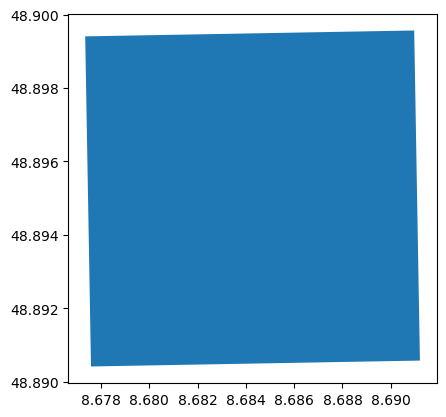

In [18]:
gdf_osm_shape_poly=gdf_osm_shape_poly.to_crs(4326)
gdf_osm_shape_poly.plot()

# get network incl. history

In [19]:
client = OhsomeClient()

In [20]:
time = "2017-01-01,2024-01-01"
fltr = "(highway in (primary, primary_link, secondary, secondary_link, tertiary, tertiary_link))  and( maxspeed in (30,50)) and type:way"
#fltr = "(highway in (primary, primary_link, secondary, secondary_link, tertiary, tertiary_link)) and type:way"

properties = "tags" # to retreive OSM tags along with the geometries
bpolys=gdf_osm_shape_poly#.buffer(0.0001)

In [22]:
response = client.elementsFullHistory.geometry.post(bpolys=bpolys, time=time, filter=fltr, properties=properties, timeout=100)

In [23]:
response_df = response.as_dataframe()
response_df

geometry  \
@osmId        @validFrom          @validTo                                                                 
way/100416890 2017-01-01 00:00:00 2019-08-30 08:57:49  LINESTRING (8.68665 48.89126, 8.68663 48.89116...   
              2019-08-30 08:57:49 2019-10-03 20:49:58  LINESTRING (8.68665 48.89126, 8.68663 48.89116...   
              2019-10-03 20:49:58 2023-01-15 12:34:09  LINESTRING (8.68664 48.89126, 8.68662 48.89115...   
              2023-01-15 12:34:09 2024-01-01 00:00:00  LINESTRING (8.68664 48.89126, 8.68662 48.89115...   
way/100416894 2017-01-01 00:00:00 2017-04-19 00:50:05      LINESTRING (8.68665 48.89126, 8.6868 48.8913)   
...                                                                                                  ...   
way/735237204 2020-01-04 21:45:24 2020-09-20 08:24:18  LINESTRING (8.6902 48.89219, 8.69041 48.89217,...   
              2020-09-20 08:24:18 2022-06-25 18:31:08  LINESTRING (8.6902 48.89219, 8.69039 48.89217,...   
              2022-06-25 18:31:08 2023-07-01 20:34:40  LINESTRING (8.6902 48.89219, 8.69039 48.89217,...   
              2023-07-01 20:34:40 2023-08-31 09:18:51  LINESTRING (8.6902 48.89219, 8.69039 48.89217,...   
              2023-08-31 09:18:51 2024-01-01 00:00:00  LINESTRING (8.6902 48.89219, 8.69039 48.89217,...   

                                                                                             @other_tags  
@osmId        @validFrom          @validTo                                                                
way/100416890 2017-01-01 00:00:00 2019-08-30 08:57:49  {'highway': 'tertiary', 'lit': 'yes', 'maxspee...  
              2019-08-30 08:57:49 2019-10-03 20:49:58  {'highway': 'tertiary', 'lit': 'yes', 'maxspee...  
              2019-10-03 20:49:58 2023-01-15 12:34:09  {'highway': 'tertiary', 'lanes': '2', 'lit': '...  
              2023-01-15 12:34:09 2024-01-01 00:00:00  {'highway': 'tertiary', 'lanes': '2', 'lit': '...  
way/100416894 2017-01-01 00:00:00 2017-04-19 00:50:05  {'highway': 'secondary', 'lit': 'yes', 'maxspe...  
...                                                                                                  ...  
way/735237204 2020-01-04 21:45:24 2020-09-20 08:24:18  {'highway': 'secondary', 'lanes': '4', 'lanes:...  
              2020-09-20 08:24:18 2022-06-25 18:31:08  {'highway': 'secondary', 'lanes': '4', 'lanes:...  
              2022-06-25 18:31:08 2023-07-01 20:34:40  {'highway': 'secondary', 'lanes': '4', 'lanes:...  
              2023-07-01 20:34:40 2023-08-31 09:18:51  {'highway': 'secondary', 'lanes': '4', 'lanes:...  
              2023-08-31 09:18:51 2024-01-01 00:00:00  {'cycleway:both': 'no', 'highway': 'secondary'...  

[702 rows x 2 columns]

### adding tags to df

In [24]:
def addingExtraTags(df_):
    df=df_.copy()
    for ind,row in df.iterrows():        
        tags = row['@other_tags']
        # Print the keys and values
        for key, value in tags.items():
            if key=="maxspeed":
                df.at[ind, "maxspeed"] = value
            if key=="maxspeed:conditional":
                df.at[ind, "maxspeed:conditional"] = value
            if key=="highway":
                df.at[ind, "highway"] = value
            if key=="name":
                df.at[ind, "name"] = value

    return df

In [25]:
selected_ms=addingExtraTags(response_df)
selected_ms

geometry  \
@osmId        @validFrom          @validTo                                                                 
way/100416890 2017-01-01 00:00:00 2019-08-30 08:57:49  LINESTRING (8.68665 48.89126, 8.68663 48.89116...   
              2019-08-30 08:57:49 2019-10-03 20:49:58  LINESTRING (8.68665 48.89126, 8.68663 48.89116...   
              2019-10-03 20:49:58 2023-01-15 12:34:09  LINESTRING (8.68664 48.89126, 8.68662 48.89115...   
              2023-01-15 12:34:09 2024-01-01 00:00:00  LINESTRING (8.68664 48.89126, 8.68662 48.89115...   
way/100416894 2017-01-01 00:00:00 2017-04-19 00:50:05      LINESTRING (8.68665 48.89126, 8.6868 48.8913)   
...                                                                                                  ...   
way/735237204 2020-01-04 21:45:24 2020-09-20 08:24:18  LINESTRING (8.6902 48.89219, 8.69041 48.89217,...   
              2020-09-20 08:24:18 2022-06-25 18:31:08  LINESTRING (8.6902 48.89219, 8.69039 48.89217,...   
              2022-06-25 18:31:08 2023-07-01 20:34:40  LINESTRING (8.6902 48.89219, 8.69039 48.89217,...   
              2023-07-01 20:34:40 2023-08-31 09:18:51  LINESTRING (8.6902 48.89219, 8.69039 48.89217,...   
              2023-08-31 09:18:51 2024-01-01 00:00:00  LINESTRING (8.6902 48.89219, 8.69039 48.89217,...   

                                                                                             @other_tags  \
@osmId        @validFrom          @validTo                                                                 
way/100416890 2017-01-01 00:00:00 2019-08-30 08:57:49  {'highway': 'tertiary', 'lit': 'yes', 'maxspee...   
              2019-08-30 08:57:49 2019-10-03 20:49:58  {'highway': 'tertiary', 'lit': 'yes', 'maxspee...   
              2019-10-03 20:49:58 2023-01-15 12:34:09  {'highway': 'tertiary', 'lanes': '2', 'lit': '...   
              2023-01-15 12:34:09 2024-01-01 00:00:00  {'highway': 'tertiary', 'lanes': '2', 'lit': '...   
way/100416894 2017-01-01 00:00:00 2017-04-19 00:50:05  {'highway': 'secondary', 'lit': 'yes', 'maxspe...   
...                                                                                                  ...   
way/735237204 2020-01-04 21:45:24 2020-09-20 08:24:18  {'highway': 'secondary', 'lanes': '4', 'lanes:...   
              2020-09-20 08:24:18 2022-06-25 18:31:08  {'highway': 'secondary', 'lanes': '4', 'lanes:...   
              2022-06-25 18:31:08 2023-07-01 20:34:40  {'highway': 'secondary', 'lanes': '4', 'lanes:...   
              2023-07-01 20:34:40 2023-08-31 09:18:51  {'highway': 'secondary', 'lanes': '4', 'lanes:...   
              2023-08-31 09:18:51 2024-01-01 00:00:00  {'cycleway:both': 'no', 'highway': 'secondary'...   

                                                         highway maxspeed  \
@osmId        @validFrom          @validTo                                  
way/100416890 2017-01-01 00:00:00 2019-08-30 08:57:49   tertiary       50   
              2019-08-30 08:57:49 2019-10-03 20:49:58   tertiary       50   
              2019-10-03 20:49:58 2023-01-15 12:34:09   tertiary       50   
              2023-01-15 12:34:09 2024-01-01 00:00:00   tertiary       50   
way/100416894 2017-01-01 00:00:00 2017-04-19 00:50:05  secondary       50   
...                                                          ...      ...   
way/735237204 2020-01-04 21:45:24 2020-09-20 08:24:18  secondary       50   
              2020-09-20 08:24:18 2022-06-25 18:31:08  secondary       50   
              2022-06-25 18:31:08 2023-07-01 20:34:40  secondary       30   
              2023-07-01 20:34:40 2023-08-31 09:18:51  secondary       30   
              2023-08-31 09:18:51 2024-01-01 00:00:00  secondary       30   

                                                                                  name  
@osmId        @validFrom          @validTo                                              
way/100416890 2017-01-01 00:00:00 2019-08-30 08:57:49                  Benckiserstraße  
              201

In [26]:
#print (selected_ms[:10])

### cleanup: drop/rename columns

In [27]:
selected_ms=selected_ms.drop(columns=['@other_tags'])

In [28]:
selected_ms_highway=selected_ms[selected_ms.highway.isin(["primary","secondary","tertiary","primary_link","secondary_link","tertiary_link"])].copy()

In [29]:
selected_ms_highway=selected_ms_highway.reset_index().copy()

In [30]:
selected_ms_highway=selected_ms_highway.rename(columns={'@osmId':'osmId', '@validFrom':'validFrom', '@validTo':'validTo', '@other_tags':'other_tags'})

In [31]:
selected_ms_highway

,osmId,validFrom,validTo,geometry,highway,maxspeed,name
0,way/100416890,2017-01-01 00:00:00,2019-08-30 08:57:49,"LINESTRING (8.68665 48.89126, 8.68663 48.89116...",tertiary,50,Benckiserstraße
1,way/100416890,2019-08-30 08:57:49,2019-10-03 20:49:58,"LINESTRING (8.68665 48.89126, 8.68663 48.89116...",tertiary,50,Benckiserstraße
2,way/100416890,2019-10-03 20:49:58,2023-01-15 12:34:09,"LINESTRING (8.68664 48.89126, 8.68662 48.89115...",tertiary,50,Benckiserstraße
3,way/100416890,2023-01-15 12:34:09,2024-01-01 00:00:00,"LINESTRING (8.68664 48.89126, 8.68662 48.89115...",tertiary,50,Benckiserstraße
4,way/100416894,2017-01-01 00:00:00,2017-04-19 00:50:05,"LINESTRING (8.68665 48.89126, 8.6868 48.8913)",secondary,50,Habermehlstraße
...,...,...,...,...,...,...,...
697,way/735237204,2020-01-04 21:45:24,2020-09-20 08:24:18,"LINESTRING (8.6902 48.89219, 8.69041 48.89217,...",secondary,50,Westliche Karl-Friedrich-Straße
698,way/735237204,2020-09-20 08:24:18,2022-06-25 18:31:08,"LINESTRING (8.6902 48.89219, 8.69039 48.89217,...",secondary,50,Westliche Karl-Friedrich-Straße
699,way/735237204,2022-06-25 18:31:08,2023-07-01 20:34:40,"LINESTRING (8.6902 48.89219, 8.69039 48.89217,...",secondary,30,Westliche Karl-Friedrich-Straße
700,way/735237204,2023-07-01 20:34:40,2023-08-31 09:18:51,"LINESTRING (8.6902 48.89219, 8.69039 48.89217,...",secondary,30,Westliche Karl-Friedrich-Straße


### rechne die Netzlänge zum Jahresanfang

In [32]:
import geopandas as gpd
import pandas as pd

# Convert validFrom and validTo to datetime
osm_data = selected_ms_highway.copy()  # Replace with your actual GeoDataFrame
osm_data["validFrom"] = pd.to_datetime(osm_data["validFrom"])
osm_data["validTo"] = pd.to_datetime(osm_data["validTo"])

# Ensure CRS is metric (projected CRS for length calculation)
if osm_data.crs is None or osm_data.crs.is_geographic:
    osm_data = osm_data.to_crs(epsg=25832)  # UTM CRS for Germany

# Define the years to check (from the dataset's min-max year)
years = list(range(osm_data["validFrom"].dt.year.min(), osm_data["validTo"].dt.year.max() + 1))

# Function to extract the valid road state on January 1st of each year
def get_state_on_date(df, target_date):
    """
    Returns the state of the road network on a given target date (e.g., January 1st of each year).
    """
    return df[(df["validFrom"] <= target_date) & (df["validTo"] >= target_date)]  # ✅ FIXED CONDITION

# Store results
yearly_lengths = []

# Iterate through each year
for year in years:
    date = pd.Timestamp(f"{year}-01-01")
    filtered_df = get_state_on_date(osm_data, date)

    if not filtered_df.empty:
        # Compute line lengths
        filtered_df = filtered_df.copy()  # Ensure it's a fresh copy to avoid warnings
        filtered_df.loc[:, "length"] = filtered_df.geometry.length
        
        # Aggregate lengths by maxspeed
        summary = filtered_df.groupby("maxspeed")["length"].sum().reset_index()
        summary["year"] = year
        yearly_lengths.append(summary)

# Combine results into a single DataFrame
df_lengths = pd.concat(yearly_lengths, ignore_index=True)

# Convert length to kilometers
df_lengths["length_km"] = df_lengths["length"] / 1000

# Pivot for better readability (Year as index, maxspeed as columns)
df_lengths_pivot = df_lengths.pivot(index="year", columns="maxspeed", values="length_km").fillna(0)



In [33]:
df_lengths_pivot.reset_index()

maxspeed,year,30,50
0,2017,0.000000,7.075184
1,2018,0.000000,7.075735
2,2019,0.108963,6.966784
3,2020,0.108963,6.966873
4,2021,0.108963,6.985498
5,2022,0.792784,6.327177
6,2023,3.270910,3.848959
7,2024,3.314730,3.805128


In [34]:
import altair as alt
import pandas as pd

# ✅ Given DataFrame
data = df_lengths_pivot.reset_index()

# ✅ Convert all values to **kilometers**
for col in data.columns[1:]:  # Skipping 'year' column
    data[col] = data[col]  # Ensure values are correctly in km

# ✅ Compute **Total Length** (sum of all maxspeeds, in km)
data["Total Length"] = data.drop(columns=["year"]).sum(axis=1)

# ✅ Convert DataFrame from wide to long format for Altair
data_long = data.melt(id_vars=["year"], var_name="maxspeed", value_name="length")

# ✅ Define color mapping: "Total Length" in gray, others with color scheme
color_scale = alt.Scale(
    domain=["30", "50", "Total Length"],  # Explicitly define all categories
    range=["green", "orange", "gray"]  # Blue (30), Orange (50), Gray (Total Length)
)

# ✅ **📌 Create Line Plot**
line_chart = alt.Chart(data_long).mark_line(point=True).encode(
    x=alt.X("year:O", title="Year"),  # Ordinal ensures all years appear
    y=alt.Y("length:Q", title="Length (km)"),  # Quantitative scale in km
    color=alt.Color("maxspeed:N", title="Maxspeed", scale=color_scale),  # Color encoding
    tooltip=["year:O", "maxspeed:N", alt.Tooltip("length:Q", format=".2f", title="Length (km)")]
).properties(
    title="Road Length Over Time by Maxspeed (Including Total Length)",
    width=600,
    height=400
)

# ✅ Display chart
road_length_plot = line_chart
road_length_plot


alt.Chart(...)

<Axes: >

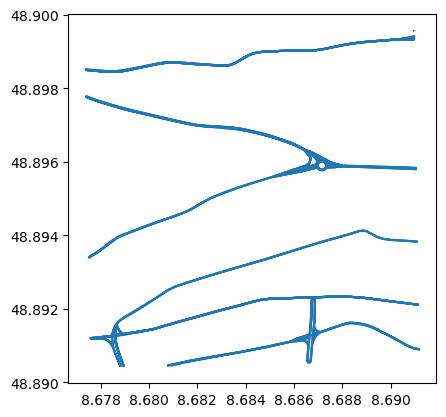

In [35]:
selected_ms_highway.plot()

In [36]:
### get accidents aclong the relevant roads

In [37]:
osm_roads_all_buffer=selected_ms_highway.copy()
osm_roads_all_buffer=osm_roads_all_buffer.to_crs(25832)
osm_roads_all_buffer["geometry"]=osm_roads_all_buffer.buffer(10)

### accidents

In [38]:
accidents = gpd.read_file(r"accident_data/accidents_germany_2017-2023_si.gpkg",
                      mask=gdf_osm_shape_poly)

In [39]:
accidents

,OBJECTID,ULAND,UREGBEZ,UKREIS,UGEMEINDE,UJAHR,UMONAT,USTUNDE,UWOCHENTAG,UKATEGORIE,...,IstPKW,IstFuss,IstKrad,IstSonstig,LICHT,USTRZUSTAND,IstGkfz,OID_,PLST,geometry
0,148466.0,8,2,31,0,2020,4,8,5,3,...,1,0,0,0,0,0,0.0,NaN,NaN,POINT (8.68102 48.89161)
1,185767.0,8,2,31,0,2019,12,16,6,3,...,1,0,0,0,2,1,0.0,NaN,NaN,POINT (8.68115 48.89163)
2,184515.0,8,2,31,0,2019,11,8,3,3,...,1,1,0,0,0,1,0.0,NaN,NaN,POINT (8.6816 48.89064)
3,174857.0,8,2,31,0,2019,3,13,7,3,...,1,0,0,0,0,0,0.0,NaN,NaN,POINT (8.68173 48.89174)
4,178107.0,8,2,31,0,2019,6,18,7,3,...,1,0,0,0,0,1,0.0,NaN,NaN,POINT (8.68206 48.89063)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
198,81051.0,8,2,31,0,2022,3,10,5,3,...,1,0,1,0,0,0,0.0,NaN,NaN,POINT (8.68623 48.89577)
199,85455.0,8,2,31,0,2022,5,12,7,3,...,1,1,0,0,0,0,0.0,NaN,NaN,POINT (8.68754 48.89597)
200,87197.0,8,2,31,0,2022,6,6,2,3,...,1,0,0,0,0,0,0.0,NaN,NaN,POINT (8.69095 48.89938)
201,199347.0,8,2,31,0,2022,6,16,4,3,...,0,1,0,1,0,0,0.0,NaN,NaN,POINT (8.6902 48.89381)


In [40]:
accidents_25832=accidents.to_crs(25832)

In [41]:
accidents_clipped = accidents_25832.clip(osm_roads_all_buffer)

In [42]:
### someday i could also flad instead of clipp

In [43]:
#import geopandas as gpd
#
## Ensure both GeoDataFrames are in the same CRS
#accidents_25832 = accidents_25832.to_crs(25832)
#osm_roads_all_buffer = osm_roads_all_buffer.to_crs(25832)
#
## **🚀 Spatial Join to Check Containment**
#accidents_flagged = accidents_25832.sjoin(osm_roads_all_buffer, how="left", predicate="within")
#
## **🚀 Add "hvs" Flag**
#accidents_flagged["hvs"] = accidents_flagged["index_right"].notna().map({True: "yes", False: "no"})
#
## **🚀 Drop unnecessary join columns**
#accidents_flagged = accidents_flagged.drop(columns=["index_right"])
#
## ✅ Show Result
#accidents_flagged.head()
#

In [44]:
accidents_clipped=accidents_clipped.to_crs(4326).copy()

In [45]:
import altair as alt
import pandas as pd

# Example DataFrame (Replace with your actual data)
data = accidents_clipped[["UJAHR","UKATEGORIE"]]


# Aggregate data: Count accidents per year and category
df_agg = data.groupby(["UJAHR", "UKATEGORIE"]).size().reset_index(name="count")

# Define the full range of years from 2017 to 2024
years = list(range(2017, 2025))

# Ensure all years are included (fill missing ones with 0)
df_full = pd.DataFrame([(year, category) for year in years for category in df_agg["UKATEGORIE"].unique()], columns=["UJAHR", "UKATEGORIE"])
df_agg = df_full.merge(df_agg, on=["UJAHR", "UKATEGORIE"], how="left").fillna(0)

# Stacked Bar Chart
bar_chart = alt.Chart(df_agg).mark_bar().encode(
    x=alt.X("UJAHR:O", title="Jahr", scale=alt.Scale(domain=years)),
    y=alt.Y("count:Q", title="Anzahl Unfälle",axis=alt.Axis(tickMinStep=1)),
    #color=alt.Color("UKATEGORIE:N", title="Unfallkategorie", scale=alt.Scale(scheme="set1")),
    color=alt.Color("UKATEGORIE:N",  # ✅ Ensure maxspeed is categorical (Nominal)
        title="Unfallkategorie",
        scale=alt.Scale(
            domain=[1, 2, 3],  
            range=["darkred", "red", "pink"]  
        ),
    ),
    tooltip=["UJAHR", "UKATEGORIE", "count"]
).properties(
    title="Unfälle pro Jahr und Unfallkategorie",
    width=600,
    height=400
)

bar_chart



alt.Chart(...)

In [46]:
accidents_clipped

,OBJECTID,ULAND,UREGBEZ,UKREIS,UGEMEINDE,UJAHR,UMONAT,USTUNDE,UWOCHENTAG,UKATEGORIE,...,IstPKW,IstFuss,IstKrad,IstSonstig,LICHT,USTRZUSTAND,IstGkfz,OID_,PLST,geometry
13,151267.0,8,2,31,0,2020,6,10,5,3,...,0,0,0,0,0,0,0.0,NaN,NaN,POINT (8.68662 48.89052)
182,148526.0,8,2,31,0,2017,4,16,6,3,...,1,0,0,0,0,0,NaN,NaN,NaN,POINT (8.68663 48.89055)
177,146033.0,8,2,31,0,2017,1,10,4,3,...,1,0,0,1,0,1,NaN,NaN,NaN,POINT (8.68673 48.89123)
175,NaN,8,2,31,0,2021,12,9,1,3,...,1,1,0,0,0,0,0.0,189538.0,NaN,POINT (8.68658 48.89124)
194,NaN,8,2,31,0,2021,6,9,7,3,...,1,0,0,0,0,0,0.0,182745.0,NaN,POINT (8.68672 48.89127)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
168,NaN,8,2,31,0,2021,2,17,6,3,...,1,0,0,0,1,0,0.0,179810.0,NaN,POINT (8.69065 48.89934)
200,87197.0,8,2,31,0,2022,6,6,2,3,...,1,0,0,0,0,0,0.0,NaN,NaN,POINT (8.69095 48.89938)
119,147022.0,8,2,31,0,2020,2,6,2,3,...,1,0,0,0,2,1,0.0,NaN,NaN,POINT (8.68779 48.89914)
117,156979.0,8,2,31,0,2018,8,8,3,3,...,1,0,0,0,0,0,1.0,NaN,NaN,POINT (8.68109 48.89868)


In [47]:
accidents_clipped['x']=accidents_clipped.geometry.x
accidents_clipped['y']=accidents_clipped.geometry.y

In [48]:
import altair as alt
import pandas as pd
import numpy as np
import altair_tiles as til  # ✅ Using Altair tiles for background


df_acc = accidents_clipped
df_acc['x']=df_acc.geometry.x
df_acc['y']=df_acc.geometry.y

# ✅ accidnets Layer
points = alt.Chart(df_acc).mark_circle(opacity=0.8).encode(
    longitude="x:Q",
    latitude="y:Q",
    #size=alt.Size("size:Q", scale=alt.Scale(range=[10, 300]), legend=None),  # Dynamic point size
    color=alt.Color("UKATEGORIE:N", title="Category", scale=alt.Scale(scheme="set1")),
    tooltip=[ "UKATEGORIE:N", "size:Q"]
).project(
    type="mercator"
)

#til_geo = alt.layer(til.create_tiles_chart(width=500, height=500, provider=til.providers.CartoDB.Positron), points).project(type="mercator").properties(width=500, height=500)
#til_geo

points


alt.Chart(...)

In [49]:
alt.data_transformers.disable_max_rows()

DataTransformerRegistry.enable('default')

In [50]:
import altair as alt
import altair_tiles as til

# viz

In [51]:
#data

In [52]:
###### Darstellung ohne Basemap aber mit Zeitstrahl

In [53]:
alt.renderers.enable('mimetype') 

RendererRegistry.enable('mimetype')

In [54]:
#full_chrt

In [207]:
kachel_infobox=gdf_osm_shape_poly.copy()

In [208]:
kachel_infobox.unfall_ratio=kachel_infobox.unfall_ratio.round(2)*100
kachel_infobox.diff_ratio_tempo30=kachel_infobox.diff_ratio_tempo30.round(2)*100

kachel_infobox.unfall_ratio=kachel_infobox.unfall_ratio.astype(int).astype(str) + " %"
kachel_infobox.diff_ratio_tempo30=kachel_infobox.diff_ratio_tempo30.astype(int).astype(str) + " Prozentpunkte"

In [224]:
df_transposed = kachel_infobox.reset_index().T

In [225]:
df_transposed_clean=df_transposed.reset_index().rename(columns= {"index": 'names',0: 'values' }).copy()

In [226]:
df_transposed_clean=df_transposed_clean[df_transposed_clean.names.isin(["id","diff_ratio_tempo30","unfall_ratio"])]
df_transposed_clean

,names,values
12,diff_ratio_tempo30,47 Prozentpunkte
13,id,1kmN2865E4224
23,unfall_ratio,-40 %


In [227]:
df_transposed_clean.names=df_transposed_clean.names.replace("diff_ratio_tempo30","Änderung Verhältnis Tempo30/50")
df_transposed_clean.names=df_transposed_clean.names.replace("unfall_ratio","Änderung Unfälle (18&19 vs 22&23)")

In [229]:
import pandas as pd
import altair as alt

# Create the DataFrame
#data = pd.DataFrame({
#    "names": ["diff_ratio_tempo30", "id", "unfall_ratio"],
#    "values": [0.47, "1kmN2865E4224", -0.397059]
#})
data=df_transposed_clean

# Base chart properties
base = alt.Chart(data).encode(
    y=alt.Y("names:N", title=None, axis=None)  # Align rows
)

# Bold text for names
names_chart = base.mark_text(
    align="left",
    baseline="middle",
    fontSize=14,
    fontWeight="bold"
).encode(
    x=alt.value(10),  # Left align text
    text="names:N"
)

# Regular text for values
values_chart = base.mark_text(
    align="left",
    baseline="middle",
    fontSize=14
).encode(
    x=alt.value(255),  # Adjust position for second column
    text="values:N"
)

# Background box to create a visible border
border = alt.Chart(pd.DataFrame({"dummy": [""]})).mark_rect(
    stroke="black",  # Border color
    strokeWidth=2,   # Border thickness
    fill=None        # Transparent background
).encode(
    x=alt.value(0),
    x2=alt.value(400),
    y=alt.value(0),
    y2=alt.value(100)
)

# Combine text with the border
infobox = (border + names_chart + values_chart).properties(
    width=400,
    height=100,
    title="Infobox Kachel"
)

infobox


<VegaLite 5 object>

If you see this message, it means the renderer has not been properly enabled
for the frontend that you are using. For more information, see
https://altair-viz.github.io/user_guide/display_frontends.html#troubleshooting


In [239]:
alt.renderers.enable('html')

RendererRegistry.enable('html')

In [282]:
import pandas as pd
import altair as alt
from datetime import datetime


# Beispiel-Daten laden
#data = selected_ms_highway[:5000].copy()
data = selected_ms_highway.copy()


Kachel_id=gdf_osm_shape_poly.reset_index()['id_left'][0]

#chart_title = alt.TitleParams(
#    ["Änderungen der zul. Geschwindigkeit (OSM, maxspeed) im zeitlicher Verlauf","für Kachel "+Kachel_id],
#    subtitle=["", "© OpenStreetMap contributors powered by ohsome API","created by FG Radverkehr - TH Wildau"],
#)


# Konvertiere die Zeitspalten in datetime-Objekte
data['validFrom'] = pd.to_datetime(data['validFrom'])
data['validTo'] = pd.to_datetime(data['validTo'])

min_time_dt = data['validFrom'].min()
max_time_dt = data['validTo'].max()

# Konvertiere die Zeitspalten in Unix-Timestamps (numerisch)
data['validFrom_ts'] = data['validFrom'].apply(lambda x: x.timestamp())
data['validTo_ts'] = data['validTo'].apply(lambda x: x.timestamp())

# Definiere den Zeitbereich für den Slider
min_time = data['validFrom_ts'].min()
max_time = data['validTo_ts'].max()

# Slider zur Auswahl eines Zeitpunkts
time_range = alt.binding_range(min=min_time, max=max_time, step=3600, name='Time') #, width=300

# Auswahl basierend auf dem Slider
time_selection = alt.param(value=min_time, bind=time_range)

# Funktion zur Formatierung des Timestamps in ein lesbares Datum
def format_timestamp(ts):
    return datetime.utcfromtimestamp(ts).strftime('%Y-%m-%d %H:%M:%S')



##### TIME #####

set_dy=270
set_dx=-200

# Textanzeige des ausgewählten Jahres, Monats und Tages
year_display = alt.Chart(pd.DataFrame({'dummy': [0]})).mark_text(
    align='left',
    dx=set_dx-50,
    dy=set_dy,
    fontSize=18
).transform_calculate(
    # Berechnung des Jahres aus dem Slider-Wert (time_selection)
    selected_year="year(datetime({0} * 1000))".format(time_selection.name)
).encode(
    text='selected_year:N'  # Zeigt das ausgewählte Jahr an
)

# Textanzeige des ausgewählten Jahres, Monats und Tages
month_display = alt.Chart(pd.DataFrame({'dummy': [0]})).mark_text(
    align='left',
    dx=set_dx,
    dy=set_dy,
    fontSize=18
).transform_calculate(
    # Berechnung des Jahres aus dem Slider-Wert (time_selection)
    selected_month="month(datetime({0} * 1000))+1".format(time_selection.name)
).encode(
    text='selected_month:N'  # Zeigt das ausgewählte Jahr an
)


way_selection = alt.selection_point(fields=['osmId'], on='click', empty='none')

#### WAY ####
sel_chart = alt.Chart(data).mark_line(dy=-100).encode(
    x=alt.X('validFrom:T',
            scale=alt.Scale(domain=[min_time_dt, max_time_dt])),
    x2=alt.X2('validTo:T'),
    y=alt.Y('maxspeed:O', 
            scale=alt.Scale(domain=data.maxspeed.unique())),
    #color=alt.Color("@osmId:N",legend=None),
).transform_filter(
    way_selection
)

#data_woDub=data.drop_duplicates(subset=['osmId'])[['osmId']]
data_woDub = data.drop_duplicates(subset=['osmId'])[['osmId']].drop_duplicates()
base_url = "https://osmlab.github.io/osm-deep-history/#/way/"
 #Dynamic text (title) with hyperlink based on the selected region
dynamic_title = alt.Chart(data_woDub).mark_text(
    align='center',  # Center the title
    fontSize=20,  # Font size for the title
    dx=60,
    dy=0,# Adjust vertical position of the title
    color="darkblue"
).transform_calculate(
    url="'https://osmlab.github.io/osm-deep-history/#/' + datum.osmId"  # Concatenate base URL and the selected 'id' field
).encode(
    text=alt.condition(
        way_selection, 'osmId:N', alt.value('')
    ),
    href=alt.condition(
        way_selection,
        'url:N',  # Reference the dynamically created URL
        alt.value('')  # Empty value when nothing is selected
    )

).add_params(
    way_selection
)


static_title = alt.Chart(pd.DataFrame({'text': ["Ausgewählter OSM Way:"]})).mark_text(
    align="center",
    fontSize=15,
    dx=50,
    dy=-25
).encode(
    text=alt.value("Ausgewählter OSM Way:")
)

dynamic_title = static_title + dynamic_title

##### GEO #####
# Poly Umriss
gdf_osm_shape_poly_utm=gdf_osm_shape_poly.to_crs(25832)
gdf_osm_shape_poly_b_utm=gdf_osm_shape_poly_utm.buffer(0.0001)
gdf_osm_shape_poly_b=gdf_osm_shape_poly_b_utm.to_crs(4326)


#gdf_osm_shape_poly_b=gdf_osm_shape_poly_b.to_crs(3857)
geoshape_base=alt.Chart(gdf_osm_shape_poly_b).mark_geoshape(opacity=0.08)

gdf_osm_shape_poly_b_utm=gdf_osm_shape_poly_utm.buffer(50)
gdf_osm_shape_poly_b=gdf_osm_shape_poly_b_utm.to_crs(4326)
geoshape_base_hidden=alt.Chart(gdf_osm_shape_poly_b).mark_geoshape(opacity=0.00)
#data=data.to_crs(3857)


# Linien visualisieren
geoshape_chart = alt.Chart(data).mark_geoshape(fillOpacity=0, 
                   #stroke="green",
                   strokeWidth=2,).encode(
    stroke=alt.Color("maxspeed:N",  # ✅ Ensure maxspeed is categorical (Nominal)
        title="Maxspeed",
        scale=alt.Scale(
            domain=["30", "50"],  # ✅ Explicit categories
            range=["green", "orange"]  # ✅ Custom colors
        ),
        #legend=alt.Legend(
        #    orient="left",  # ✅ Position legend to the left
        #    symbolType="stroke",  # ✅ Force filled square legend symbols
        #    symbolStrokeWidth=2  # ✅ Keeps stroke width for consistency
        #)
        legend=None
    ),

    #color=alt.Color('osmId:N', legend=alt.Legend(orient='right', offset=-150))
      # Einfärbung nach maxspeed
    tooltip=[
        alt.Tooltip('osmId:N', title="osmId"),
        alt.Tooltip('validFrom:T', title="Valid From"),
        alt.Tooltip('validTo:T', title="Valid To"),
        alt.Tooltip('maxspeed:Q', title="Maxspeed"),
        alt.Tooltip('highway:N', title="Highway"),
        alt.Tooltip('name:N', title="Name")
    ]
).transform_filter(
    # Filter basierend auf dem ausgewählten Zeitintervall
    (alt.datum['validFrom_ts'] <= time_selection) &
    (alt.datum['validTo_ts'] >= time_selection)
).add_params(
    way_selection
).project(
    type='mercator'  # Mercator-Projektion für Geo-Daten
)


# ✅ **Accident Points Layer (Filtered by Year)**
df_acc['x'] = df_acc.geometry.x
df_acc['y'] = df_acc.geometry.y

points = alt.Chart(df_acc).mark_circle(size=100, opacity=0.95).encode(
    longitude="x:Q",
    latitude="y:Q",
    #color=alt.Color("UKATEGORIE:N", title="Category", scale=alt.Scale(scheme="set1"), 
    color=alt.Color("UKATEGORIE:N",  # ✅ Ensure maxspeed is categorical (Nominal)
        title="Unfallkategorie",
        scale=alt.Scale(
            domain=[1, 2, 3],  
            range=["darkred", "red", "pink"]  
        ),
    #legend=alt.Legend(orient="left")
    legend=None
),
    tooltip=["UJAHR", "UKATEGORIE"]
).transform_filter(
    f"datum.UJAHR == year(datetime({time_selection.name} * 1000))"  # ✅ Correct year filtering
).project(type="mercator")



# BASEMAP
#til_geo=til.add_tiles(geoshape_base, provider=til.providers.CartoDB.Positron)#.properties(width=600, height=400)
## Unfortunatly concatenation ist not yet supportet in altair tiles, therefore i will leave this for now
# https://github.com/vega/altair_tiles/issues/33

# Render das Chart
geo_chart = geoshape_base_hidden + geoshape_base + geoshape_chart +points+ year_display +month_display 
geo_chart = geo_chart.add_params(
    time_selection
)


# geo
geo_chart=geo_chart.properties(width=600, height=600)#.configure_legend(direction="vertical")

#geo_chart=geo_chart.


### Kontext
road_length_plot =road_length_plot.properties(width=300, height=150)
bar_chart=bar_chart.properties(width=300, height=150)
road_and_bar_chart = alt.vconcat(road_length_plot, bar_chart, spacing=10).resolve_scale(
    color="independent"
)

## way_select_chart
way_select_chart=dynamic_title & sel_chart

spacer = alt.Chart(pd.DataFrame({'dummy': [0]})).mark_text().properties(height=30)
#chart | sel_chart + dynamic_title

til_geo = alt.layer(til.create_tiles_chart(width=500, height=500, provider=til.providers.CartoDB.Positron), geo_chart).project(type="mercator").properties(width=500, height=500)


#full_chrt=(geo_chart | way_select_chart & road_and_bar_chart ).resolve_scale(
full_chrt=(infobox & til_geo  | alt.vconcat(way_select_chart,spacer, road_and_bar_chart) ).resolve_scale(
    color='independent' 
).resolve_legend(
    color='independent' 
)

#full_chrt

#chart_title = alt.TitleParams(
#    ["Änderungen der zul. Geschwindigkeit (OSM, maxspeed) im zeitlicher Verlauf","für Kachel "+Kachel_id],
#    subtitle=["", "© OpenStreetMap contributors powered by ohsome API","created by FG Radverkehr - TH Wildau"],
#)

##############################################################
# adding Titel and Subtitle
title = alt.Chart(
    {"values": [{"text": "Zul. Geschwindigkeit und Unfälle"}]}
).mark_text(size=18, align='left', lineBreak='\n').encode(  #,anchor='start' , align='left'
    text="text:N",
    #x=alt.value(0)
)
subtitle = alt.Chart(
    {"values": [{"text": "Änderungen der zul. Geschwindigkeit (OSM, maxspeed) und Unfälle mit Personenschaden im zeitlicher Verlauf für eine ausgwählte 1x1km-Kachel"}]}
).mark_text(size=12, align='left').encode(  #,anchor='start' , align='left'
    text="text:N",
    #x=alt.value(0)
)



quelle = alt.Chart(
    {"values": [{"text": "Quelle: \n" 
                 "OpenStreetMap contributors powered by ohsome API \n" 
                 "Unfallatlas Destatis \n" 
                 "     Erstellung TH Wildau - FG Radverkehr" 
                 }]},
).mark_text(size=11, align='left', lineBreak='\n').encode(
    text="text:N",
    x=alt.value(600),
)


#quelle2 = alt.Chart(
#    {"values": [{"text": "     Erstellung TH Wildau - FG Radverkehr"}]}
#).mark_text(
#    size=11, 
#    align='left', 
#    lineBreak='\n'
#).encode(
#    text="text:N",
#    x=alt.value(600),
#    #href=alt.value('https://www.th-wildau.de/studieren-weiterbilden/studiengaenge/radverkehr-m-eng/labor-radverkehr')  # Move href inside encode
#')




  
fullchart_title= alt.vconcat(
    title,
    subtitle,
    full_chrt,
    #quelle1 & quelle2
    quelle1, 
    quelle2

).configure_view(
    stroke=None
)

fullchart_title




#full_chrt.configure_legend(
#    orient="left",  # ✅ Places legend on the left
#    direction="vertical",  # ✅ Stacks legends vertically
#    titleAnchor="end",  # ✅ Aligns legend titles to the start
#    titleFontSize=12,  # Adjusts legend title size
#    labelFontSize=10  # Adjusts legend label size
#)


alt.VConcatChart(...)

In [242]:
#fullchart_title.save("output/")
fullchart_title.save("output/"+Kachel_id+"_2022_raster_map_charts_new.html")

In [232]:
full_chrt

<VegaLite 5 object>

If you see this message, it means the renderer has not been properly enabled
for the frontend that you are using. For more information, see
https://altair-viz.github.io/user_guide/display_frontends.html#troubleshooting
